# Explaining Text Classifiers with LIME
## CHAPTER 05 - *Practical Exposure of using LIME in ML*

From **Applied Machine Learning Explainability Techniques** by [**Aditya Bhattacharya**](https://www.linkedin.com/in/aditya-bhattacharya-b59155b6/), published by **Packt**

### Objective

In this notebook, we will applying LIME to explain black-box text classifiers. Before starting with this notebook, I would recommend you to go through the concepts discussed in Chapter 05 - Practical Exposure of using LIME in ML and Chapter 04 - Introduction to LIME for model interpretability to have a better understanding on the code provided in the notebook.

### Installing the modules

Install the following libraries in Google Colab or your local environment, if not already installed.

In [ ]:
!pip install --upgrade pandas numpy matplotlib seaborn scikit-learn nltk lime xgboost swifter

### Loading the modules

In [72]:
import warnings
warnings.filterwarnings('ignore','.*do not.*',)

import pandas as pd
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', 150)  
import numpy as np

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk import pos_tag

import lime
from lime.lime_text import LimeTextExplainer
from lime import submodular_pick
import os
from glob import glob

from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split 
from sklearn.feature_extraction.text import TfidfVectorizer
import re # Regex module for applying Regex commands to text
import swifter #for multi-threading/ parallel processing

np.random.seed(123)

In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

### About the data

**Sentiment Polarity Dataset v2.0 - Movie Review Data**

This dataset is used for Sentiment Analysis from text data. The dataset consists of 1000 positive and 1000 negative processed moview reviews which was introduced in Pang/Lee ACL 2004 (Released in June 2004). It is used for solving the classification problem of classifying moview reviews as positive or negative based on the review.  More detail about the dataset can be found at: https://www.cs.cornell.edu/people/pabo/movie-review-data/.


### Loading the data

In [34]:
def read_txtfile(FilePath):
    with open(FilePath,'r') as fp:
        txt = fp.read()
    return txt

In [35]:
pos_txtfiles = glob('datasets/movie_reviews/pos/*')
neg_txtfiles = glob('datasets/movie_reviews/neg/*')

positive_samples = [read_txtfile(file) for file in pos_txtfiles]
negative_samples = [read_txtfile(file) for file in neg_txtfiles]

In [36]:
print(f"Total positive and negative samples:{len(pos_txtfiles),len(neg_txtfiles)}")

Total positive and negative samples:(1000, 1000)


In [37]:
df = pd.DataFrame(list(zip(positive_samples, 
                  [1]*len(positive_samples))) + list(zip(negative_samples,[0]*len(negative_samples))),
                  columns =['text','label'])
df.head()

,text,label
0,"films adapted from comic books have had plenty of success , whether they're about superheroes ( batman , superman , spawn ) , or geared toward kid...",1
1,"every now and then a movie comes along from a suspect studio , with every indication that it will be a stinker , and to everybody's surprise ( per...",1
2,"you've got mail works alot better than it deserves to . \nin order to make the film a success , all they had to do was cast two extremely popular ...",1
3,""" jaws "" is a rare film that grabs your attention before it shows you a single image on screen . \nthe movie opens with blackness , and only dist...",1
4,moviemaking is a lot like being the general manager of an nfl team in the post-salary cap era -- you've got to know how to allocate your resources...,1


### Data Preprocessing

In [44]:
# Data Preprocessing
def preprocess(df):
    '''
    Apply some initial preprocessing to the data
    '''
    df.text = df.text.str.lower()
    df.text = df.text.swifter.apply(lambda x:re.sub('[^a-zA-Z]',' ',x))
    df.text = df.text.swifter.apply(lambda x:re.sub(' +',' ',x))
    
    return df

df = preprocess(df)
df.head()

Pandas Apply:   0%|          | 0/2000 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/2000 [00:00<?, ?it/s]

,text,label
0,films adapted from comic books have had plenty of success whether they re about superheroes batman superman spawn or geared toward kids casper or ...,1
1,every now and then a movie comes along from a suspect studio with every indication that it will be a stinker and to everybody s surprise perhaps e...,1
2,you ve got mail works alot better than it deserves to in order to make the film a success all they had to do was cast two extremely popular and at...,1
3,jaws is a rare film that grabs your attention before it shows you a single image on screen the movie opens with blackness and only distant alien ...,1
4,moviemaking is a lot like being the general manager of an nfl team in the post salary cap era you ve got to know how to allocate your resources ev...,1


In [45]:
def advance_processing(text):
    '''
    One more layer of Lexical processing on text data.
    - We will first apply tokenization
    - Then remove StopWords
    - Next We will do POS tagging
    - Then we will apply Lemmatization
    '''
    stopword = stopwords.words('english')
    lema = WordNetLemmatizer()
    tokens = word_tokenize(text)
    tokens = list(filter(lambda x:x not in stopword , tokens))
    processed_token = []
    for w,pos in pos_tag(tokens):
        try:
            processed_token.append(lema.lemmatize(w,pos[0].lower()))
        except:
            processed_token.append(lema.lemmatize(w))
    processed_text = ' '.join(processed_token)
    return processed_text

In [53]:
df.text = df.text.swifter.apply(advance_processing)
df.head()

Pandas Apply:   0%|          | 0/2000 [00:00<?, ?it/s]

,text,label
0,film adapt comic book plenty success whether superheroes batman superman spawn gear toward kid casper arthouse crowd ghost world never really comi...,1
1,every movie come along suspect studio every indication stinker everybody surprise perhaps even studio film become critical darling mtv film electi...,1
2,get mail work alot better deserves order make film success cast two extremely popular attractive star share screen two hour collect profit real ac...,1
3,jaw rare film grab attention show single image screen movie open blackness distant alien like underwater sound come first ominous bar composer joh...,1
4,moviemaking lot like general manager nfl team post salary cap era get know allocate resource every dollar spend free agent defensive tackle one le...,1


### Model training 

In [132]:
features = df['text'].values
labels = df['label'].values
x_train_df,x_test_df,y_train,y_test = train_test_split(features,labels,test_size=0.2,random_state=123)

In [158]:
tfidf = TfidfVectorizer(max_features = 10000, ngram_range=(1,3))
x_train = tfidf.fit_transform(x_train_df).toarray()
x_test = tfidf.transform(x_test_df).toarray()

In [159]:
x_train.shape, x_test.shape

((1600, 10000), (400, 10000))

In [160]:
model = XGBClassifier(n_estimators = 800)
model.fit(x_train, y_train)

[08:06:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=800, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [161]:
model.score(x_test, y_test)

0.8025

### Model Explainability using LIME

Now that we have a trained model using the XGBoost algorithm, it can be treated as a black-box algorithm which will be explained by LIME. XGBoost is not an inherently interpretable model and based on the number of estimators, the complexity of the algorithm might vary. Let us see how we can use LIME to explain the outcome of the trained model. 

In [162]:
predict_fn = lambda x: model.predict_proba(tfidf.fit_transform(x).toarray())

In [163]:
# Defining the LIME explainer object
explainer = LimeTextExplainer(class_names=['negative', 'positive'])

In [176]:
idx = 30
class_names=['negative', 'positive']
exp = explainer.explain_instance(x_test_df[idx], predict_fn, num_features=5)
print('Review Number: %d' % idx)
print('Predicted class =', class_names[model.predict([x_test[idx]])[0]])
print('True class: %s' % class_names[y_test[idx]])

Review Number: 30
Predicted class = negative
True class: negative


In [177]:
print('Explanation for class %s' % class_names[y_test[idx]])
print('\n'.join(map(str, exp.as_list())))

Explanation for class negative
('attention', -0.2196236264943453)
('right', -0.20396860597172178)
('quote', 0.1762014297447864)
('something', -0.14444944901802007)
('phrase', 0.12900795887092503)


In [179]:
model.predict_proba([x_test[idx]])

array([[9.992727e-01, 7.272831e-04]], dtype=float32)

In [178]:
exp.show_in_notebook()

As we can see, getting the LIME explanation using the Python framework was easy and required only few lines of code. Now, let's try to understand what the visualization is telling us:
- The left-most bar plot is showing us the prediction probabilities, which can be treated as the model's confidence level in making the prediction. In this case, the model is 100% confident that the particular passenge would 'survive'.
- The second visualization is probably the most important visualization which provides maximum explainability. This visualization tells us that the most important feature with a feature importance score of 38% is the feature 'Sex', followed by 'Age' with a feature importance score of 26%. But as illustrated in orange, for the selected data instance the features 'Sex', Passenger Class or 'PClass', 'Fare' and Port of Embarkation as Cherbourg or 'Embarked_C' contributes towards the model outcome of 'survival' along with their threshold scores learnt from the entire dataset. Whereas, the feature 'Age' was more inclined towards predicting the outcome as 'Did not Survive' as the particular passengers age was 38 and usually passengers above the age of 38 have lower chances of surviving the disaster. The threshold feature values learnt by the LIME model is also inalignment with our own *common sense* and *apriori knowledge*. Even in case of the actual incident of the sinking of the Titanic which happened over 100 years ago, Female and Children were given the first preference to escape the sinking ship using the Life Boats. Similarly, 1st class passengers who had paid higher ticket fares got a higher preference to take the life boats and thus having higher chances of survival. So, the model explanation provided is *human-friendly* and consistent with our prior belief.
- The right-most visualization shows the top 5 features and their respective values in which the features highlighted in orange are contributing towards class 1 while features highlighted in blue is contributing towards class 0.


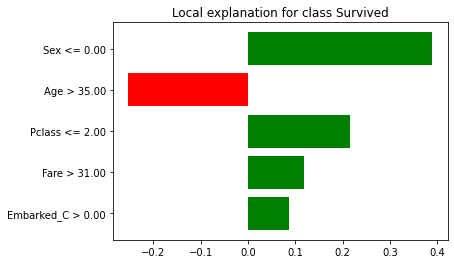

In [37]:
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

So, the explanations are not just based on the features but based on the feature value pairs. Although the explanations are local, but it does provide a global perspective of the model.

In [38]:
# Let's use SP-LIME to return explanations on a sample data set 
# and obtain a non-redundant global decision perspective of the black-box model
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        data[features.columns].values,
                                        predict_fn, 
                                        num_features=5,
                                        num_exps_desired=10)

In [39]:
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


SP-LIME Local Explanations


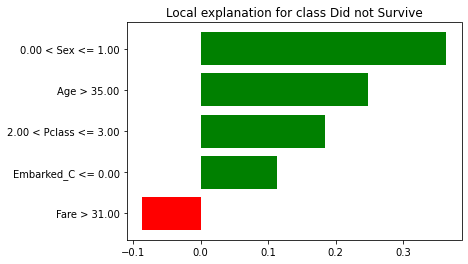

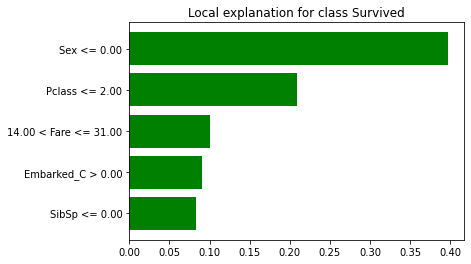

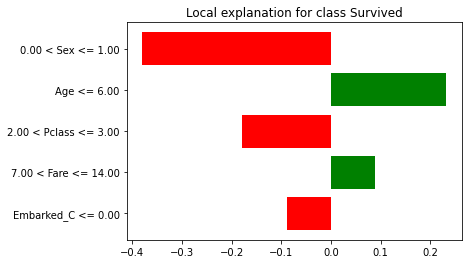

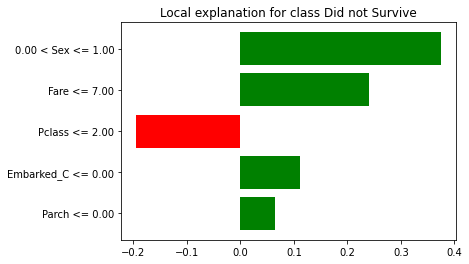

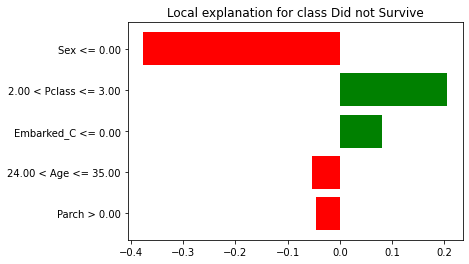

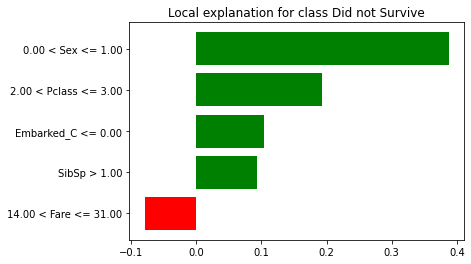

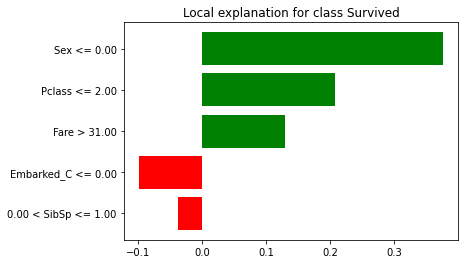

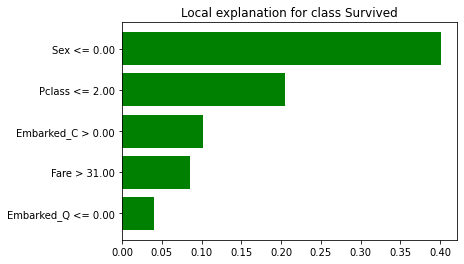

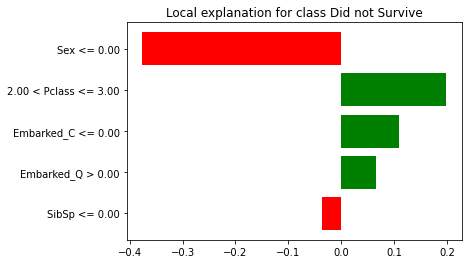

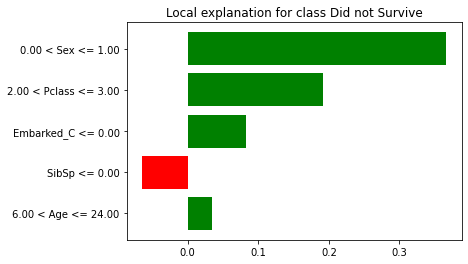

In [40]:
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp.sp_explanations]
print('SP-LIME Local Explanations')

The above explanation visualizations are obatined using the SP-LIME method and are similar to the LIME algorithm, but this tries to draw diverse samples from the entire training set to provide a global uderstanding of the model. The time-complexity of the SP-LIME algorithm is high and depends on the size of the dataset, but all the examples picked up are quite consistent with logical thinking and hence these explanations are human-friendly!

## Final Thoughts

## Reference

1. Titanic - Machine Learning from Disaster - Kaggle -https://www.kaggle.com/c/titanic/
2. LIME Open Source Python Framework in GitHub - https://github.com/marcotcr/lime
3. Research paper on LIME - [“Why Should I Trust You?”
Explaining the Predictions of Any Classifier](https://arxiv.org/pdf/1602.04938.pdf)
4. Original blog post on LIME by the author - https://homes.cs.washington.edu/~marcotcr/blog/lime/
4. Some of the utility functions and code are taken from the GitHub Repository of the author - Aditya Bhattacharya https://github.com/adib0073